In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/100-bird-species/EfficientNetB0 model-510-(224 X 224)-99.21.h5
/kaggle/input/100-bird-species/birds.csv
/kaggle/input/100-bird-species/images to predict/6.jpg
/kaggle/input/100-bird-species/images to predict/5.jpg
/kaggle/input/100-bird-species/images to predict/1.jpg
/kaggle/input/100-bird-species/images to predict/4.jpg
/kaggle/input/100-bird-species/images to predict/3.jpg
/kaggle/input/100-bird-species/images to predict/2.jpg
/kaggle/input/100-bird-species/valid/DALMATIAN PELICAN/5.jpg
/kaggle/input/100-bird-species/valid/DALMATIAN PELICAN/1.jpg
/kaggle/input/100-bird-species/valid/DALMATIAN PELICAN/4.jpg
/kaggle/input/100-bird-species/valid/DALMATIAN PELICAN/3.jpg
/kaggle/input/100-bird-species/valid/DALMATIAN PELICAN/2.jpg
/kaggle/input/100-bird-species/valid/WATTLED CURASSOW/5.jpg
/kaggle/input/100-bird-species/valid/WATTLED CURASSOW/1.jpg
/kaggle/input/100-bird-species/valid/WATTLED CURASSOW/4.jpg
/kaggle/input/100-bird-species/valid/WATTLED CURASSOW/3.jpg
/kaggle

In [3]:
import cv2
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [4]:
#Defining Parameters

input_shape = (224,224,3)
resnet_weights_path = 'imagenet'
num_classess = 510
image_size = 224
batch_size = 64

In [5]:
data_generator = ImageDataGenerator(preprocessing_function = preprocess_input)
train_generator = data_generator.flow_from_directory('/kaggle/input/100-bird-species/train', target_size = (image_size,image_size),
                                                    batch_size = batch_size, shuffle = True, class_mode ='categorical')

val_generator = data_generator.flow_from_directory('/kaggle/input/100-bird-species/valid',
                                                  target_size = (image_size, image_size),
                                                  batch_size = batch_size,
                                                  shuffle = False, class_mode = 'categorical')
test_generator = data_generator.flow_from_directory('/kaggle/input/100-bird-species/test',
                                                  target_size = (image_size, image_size),
                                                  batch_size = batch_size,
                                                  shuffle = False, class_mode = 'categorical')

Found 81950 images belonging to 510 classes.
Found 2550 images belonging to 510 classes.
Found 2550 images belonging to 510 classes.


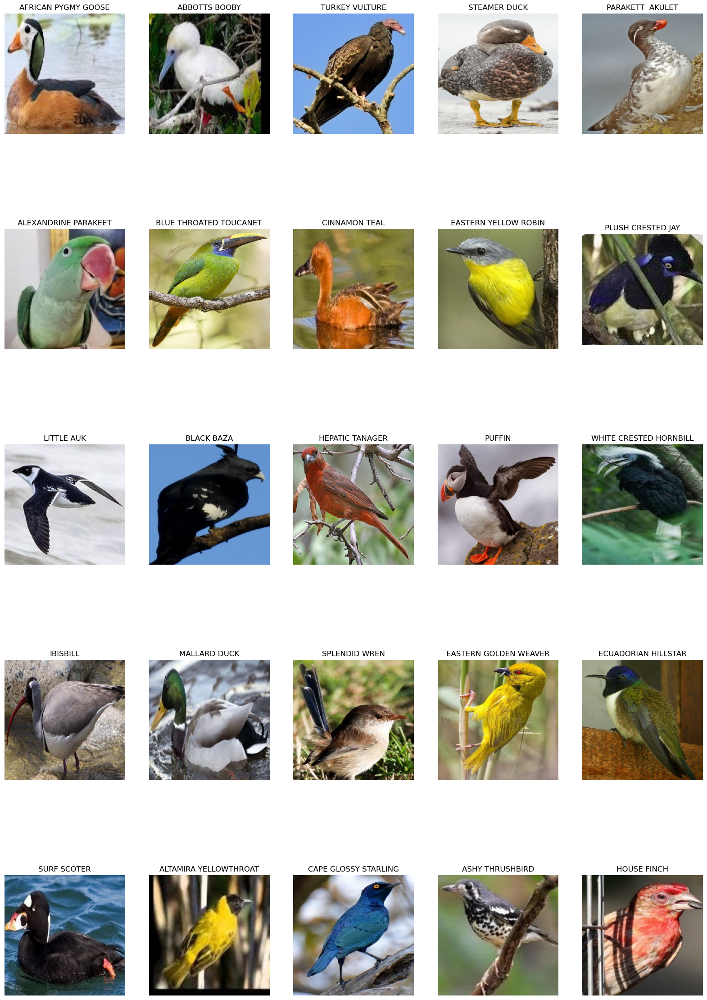

In [6]:
import random

#filepaths of training data
train_files = train_generator.filepaths
#510 classes for training data
train_labels = train_generator.classes
class_name = list(train_generator.class_indices.keys())

#total length of training data 
length_images = len(train_labels)
sample_size = min(length_images,25)
sample_images = random.sample(range(length_images),sample_size)

for i in range(sample_size):
    plt.rcParams['figure.figsize']=(20,30)
    img=plt.imread(train_files[sample_images[i]])
    plt.subplot(5,5,i+1)
    plt.title(class_name[train_labels[sample_images[i]]])
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [7]:
# Pre-trained Model Configuration

new_model = Sequential()
new_model.add(ResNet50(include_top = False,
                      pooling = 'avg',
                      weights = resnet_weights_path))

94765736/94765736 [==============================] - 0s 0us/step


In [8]:
new_model.add(Dense(num_classess, activation ='softmax'))

In [9]:
new_model.layers[0].trainable= True

In [10]:
new_model.compile(loss = 'categorical_crossentropy',
                 optimizer='sgd',
                 metrics=['accuracy'])

In [11]:
new_model.fit(train_generator, steps_per_epoch=700, batch_size = batch_size, validation_data= val_generator, epochs=5)

Epoch 1/5
700/700 [==============================] - 560s 765ms/step - loss: 3.6241 - accuracy: 0.4091 - val_loss: 1.1920 - val_accuracy: 0.7980
Epoch 2/5
700/700 [==============================] - 530s 756ms/step - loss: 0.9621 - accuracy: 0.8346 - val_loss: 0.5308 - val_accuracy: 0.8980
Epoch 3/5
700/700 [==============================] - 531s 758ms/step - loss: 0.5199 - accuracy: 0.9033 - val_loss: 0.3638 - val_accuracy: 0.9322
Epoch 4/5
700/700 [==============================] - 530s 757ms/step - loss: 0.3492 - accuracy: 0.9348 - val_loss: 0.2734 - val_accuracy: 0.9467
Epoch 5/5
700/700 [==============================] - 531s 759ms/step - loss: 0.2563 - accuracy: 0.9545 - val_loss: 0.2232 - val_accuracy: 0.9506


In [12]:
test_predictions = new_model.predict(test_generator)
test_labels = test_generator.classes
test_files = test_generator.filepaths
class_labels = list(test_generator.class_indices.keys())

40/40 [==============================] - 25s 602ms/step


In [13]:
from sklearn.metrics import accuracy_score
test_acc = accuracy_score(test_labels, np.argmax(test_predictions, axis=1))

print(f'Test accuracy: {test_acc:.2%}')

Test accuracy: 97.29%


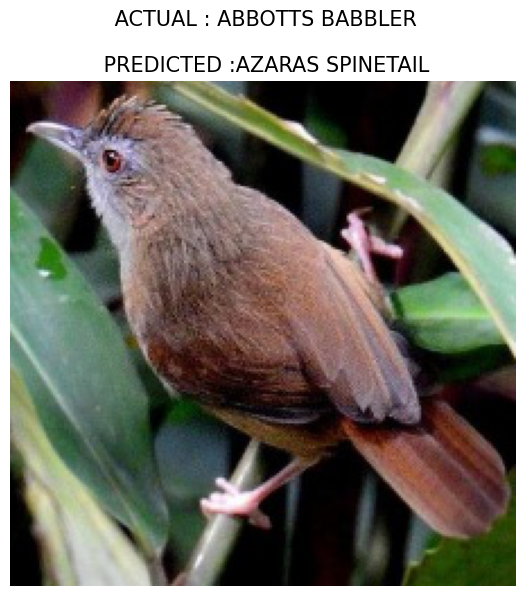

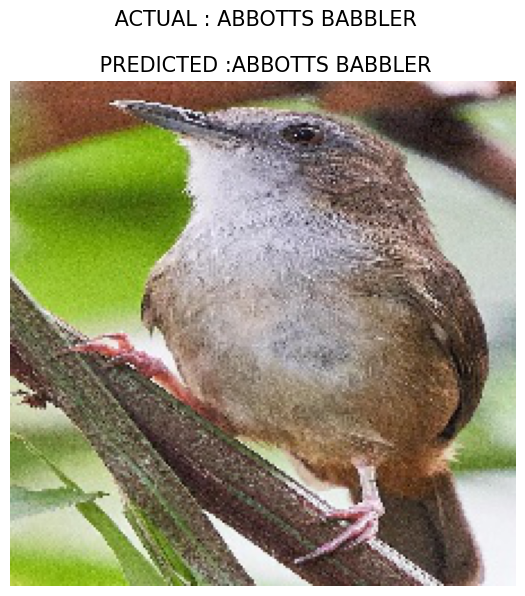

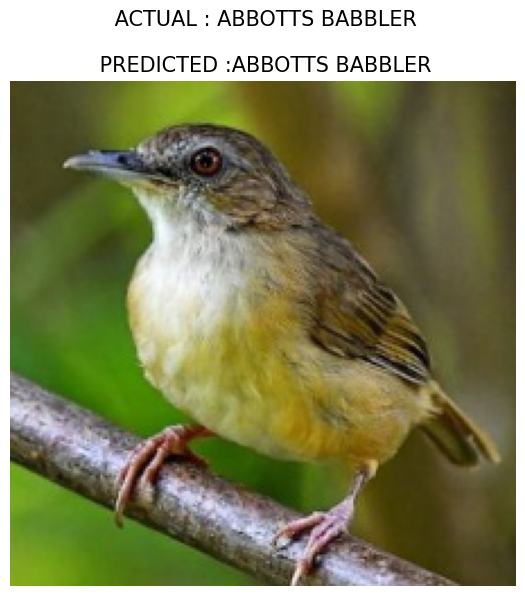

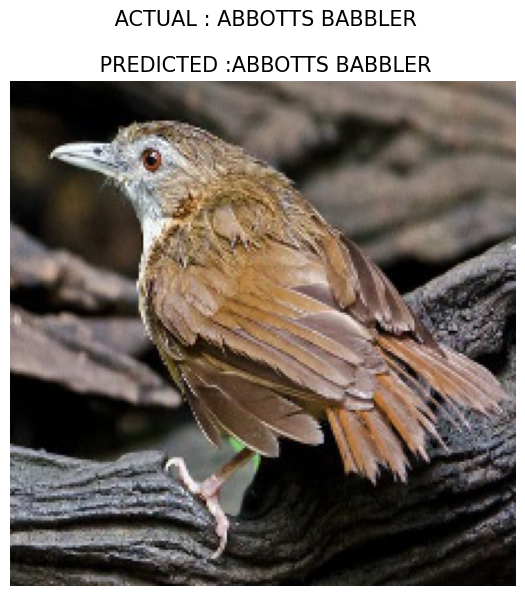

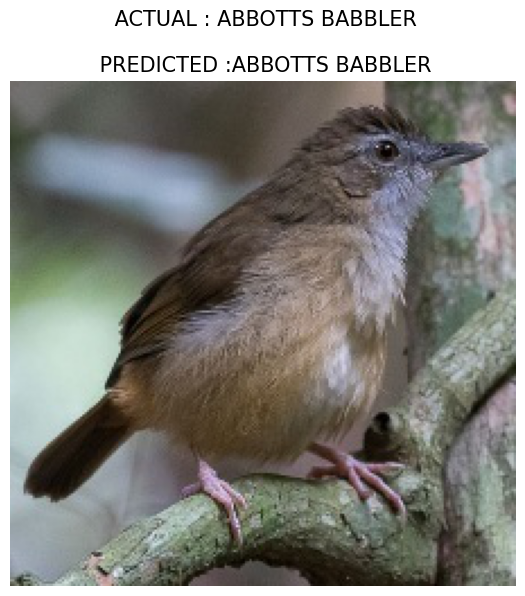

...

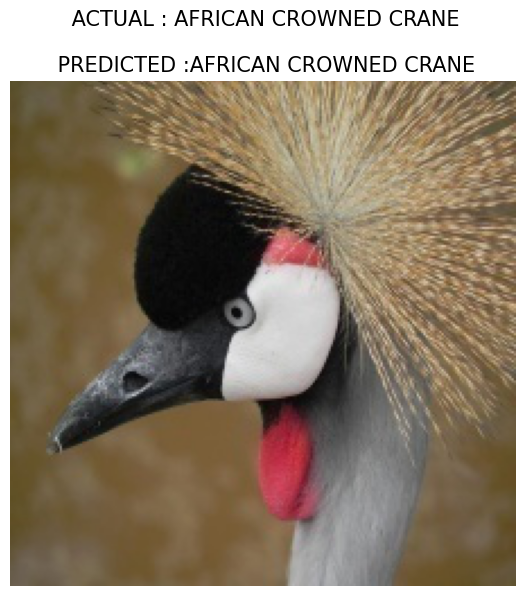

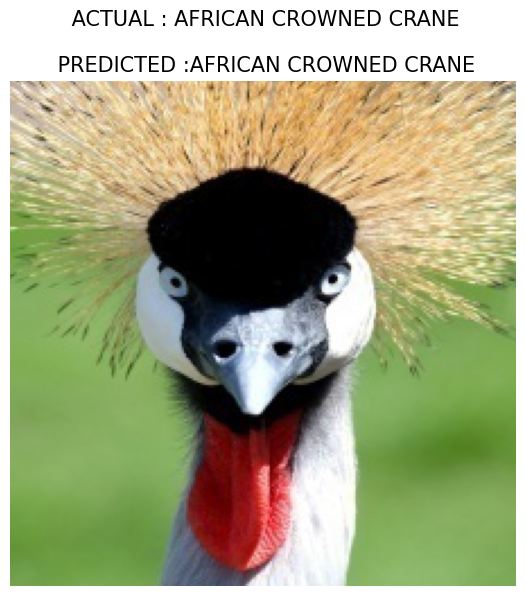

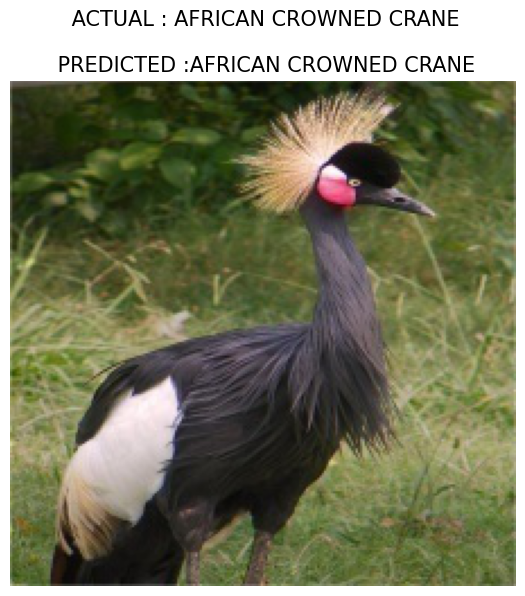

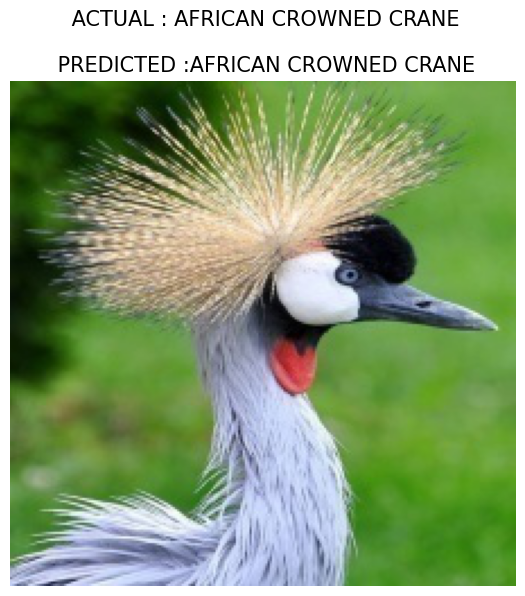

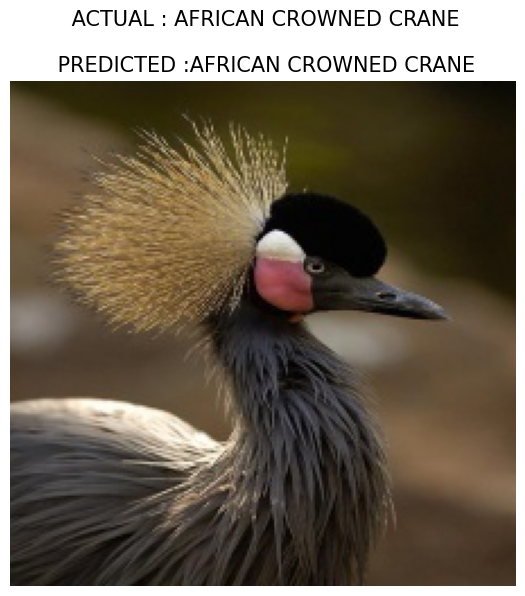

In [14]:
length = len(test_labels)
sample = min(length, 20)

for i in range(sample):
    plt.rcParams['figure.figsize']=(30,50)
    img = plt.imread(test_files[i])
    pred_label = np.argmax(test_predictions[i])
    actual_label = test_labels[i]
    
    plt.subplot(5,4,i+1)
    plt.imshow(img)
    plt.title(f" ACTUAL : {class_labels[actual_label]}\n\n PREDICTED :{class_labels[pred_label]}",fontdict={'fontsize':15})
    plt.axis('off')
    plt.show()

In [15]:
model = new_model.save("model.h5")

In [16]:
import pickle
pickle.dump(model, open('saved_model.pkl','wb'))

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......dense
.........vars
............0
............1
......functional
.........layers
............activation
...............vars
............activation_1
...............vars
............activation_10
...............vars
............activation_11
...............vars
............activation_12
...............vars
............activation_13
...............vars
............activation_14
...............vars
............activation_15
...............vars
............activation_16
...............vars
............activation_17
...............vars
............activation_18
...............vars
............activation_19
...............vars
............activation_2
...............vars
............activation_20
...............vars
............activation_21
...............vars
............activation_22
...............vars
............activation_23
...............vars
............activation_24
...............vars
............ac